In [2]:
import os

import rasterio
# import shapely.geometry
import geojson

from PIL import Image
from transformers import AutoProcessor, AutoModelForCausalLM 

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import spec_defs

from garuda.ops import obb_to_aa

import torch
import torchvision.transforms as transforms
if torch.cuda.is_available():
    device = torch.device("cuda:3")
else:
    device = torch.device("cpu")
    print("CUDA is not available, using CPU")

model1 = AutoModelForCausalLM.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True, torch_dtype='auto').eval().to(device)
processor1 = AutoProcessor.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True)

model2 = AutoModelForCausalLM.from_pretrained("microsoft/Florence-2-large-ft", trust_remote_code=True, torch_dtype='auto').eval().to(device)
processor2 = AutoProcessor.from_pretrained("microsoft/Florence-2-large-ft", trust_remote_code=True)

torch_dtype = torch.float16 if torch.cuda.is_available() else torch.float32

/home/nupoor.assudani/anaconda3/envs/nkaenv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2025-02-10 14:32:51.456845: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1739178171.475356 3209543 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1739178171.481013 3209543 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-10 14:32:51.499175: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/home/nupoor.assudani/anaconda3/envs/nkaenv/lib/python3.12/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Im

In [1]:
from PIL import ImageEnhance

In [3]:
# finalised list of prompts

tap1 = "OD"
tep1 = ""
tap2 = "OPEN_VOCABULARY_DETECTION"
tep2 = "brick kilns"
tap3 = "OPEN_VOCABULARY_DETECTION"
tep3 = "brick kilns with chimneys"
tap4 = "OPEN_VOCABULARY_DETECTION"
tep4 = "brick kilns and chimneys"
tap5 = "OPEN_VOCABULARY_DETECTION"
tep5 = "chimneys"
tap6 = "OPEN_VOCABULARY_DETECTION"
tep6 = "oval brick kilns, circular brick kilns, rectangular brick kilns, chimneys"
tap7 = "OPEN_VOCABULARY_DETECTION"
tep7 = "satellite image of oval brick kilns, circular brick kilns, rectangular brick kilns, chimneys"
tap8 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep8 = "brick kilns"
tap9 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep9 = "brick kilns with chimneys"
tap10 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep10 = "brick kilns and chimneys"
tap11 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep11 = "chimneys"
tap12 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep12 = "oval brick kilns, circular brick kilns, rectangular brick kilns, chimneys"
tap13 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep13 = "satellite image of oval brick kilns, circular brick kilns, rectangular brick kilns, chimneys"
task_prompts = [tap1, tap2, tap3, tap4, tap5, tap6, tap7, tap8, tap9, tap10, tap11, tap12, tap13]
text_prompts = [tep1, tep2, tep3, tep4, tep5, tep6, tep7, tep8, tep9, tep10, tep11, tep12, tep13]

In [4]:
import re

In [15]:
def zero_shot_bbox(image_path, label_path, task, text):
    metadata_path = "/home/patel_zeel/kiln_compass_24/data/lucknow_airshed/metadata.geojson"
    with open(metadata_path) as f:
        metadata = geojson.load(f) # loading metadat
    image_tensor,label_tensor, image_metadata = spec_defs.load_image_and_label(image_path, label_path, metadata) # loading image and labels
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy() # creating np array of image
    height, width, _ = image_np.shape # finding height and width of image in pixels
    image = Image.fromarray((image_np * 255).astype(np.uint8))  # Convert back to 8-bit per channel
    image.convert('RGB')
    con_image = ImageEnhance.Contrast(image)
    con_image = con_image.enhance(1.5)
    text_prompt = task + text # creating prompt to give to model
    inputs = processor1(text = text_prompt, images=con_image, return_tensors="pt").to(device, torch_dtype) # giving input to model
    generated_ids = model1.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=4096,
        num_beams=3,
        do_sample=False
    )
    generated_text = processor1.batch_decode(generated_ids, skip_special_tokens=False)[0] # model output
    od_parsed = processor1.post_process_generation(generated_text, task=task, image_size=(image.width, image.height))
    # print(od_parsed)
    model_op = od_parsed[task] # relevant portion of model output
    op_bboxes = []
    op_labels = []
    print(model_op)
    if type(model_op) != str:
        op_bboxes = model_op['bboxes'] # bounding boxes in [xmin, ymin, xmax, ymax] format
        if task == "<OPEN_VOCABULARY_DETECTION>":
            op_labels = model_op['bboxes_labels'] # labels
        else:
            op_labels = model_op['labels'] #labels
    else:
        lbl = model_op.split("<loc_")[0].strip()
        locs = re.findall(r"<loc_(\d+)>", model_op)
        if len(locs) == 4:  # Ensure we have exactly 4 values
            bbox = [int(locs[0]), int(locs[1]), int(locs[2]), int(locs[3])]
            op_bboxes.append(bbox)
            op_labels.append(lbl)
     
    filtered_bboxes = []
    filtered_labels = []
    if op_bboxes!=[] and op_labels!=[]:
        for bbox, label in zip(op_bboxes, op_labels):
            if label != "satellite image":
                filtered_bboxes.append(bbox)
                filtered_labels.append(label)

    return image, filtered_labels, filtered_bboxes, label_tensor, image_metadata, height, width

In [6]:
def box_area(box): # box in [xmin, ymin, xmax, ymax] format
    return (box[2] - box[0]) * (box[3] - box[1]) # calculating area

def convert_to_xyxy(box, h_im, w_im): # box: [label, x_center, y_center, width, height], YOLO aa format
    x_center, y_center, width, height = box[1], box[2], box[3], box[4]
    x_min = (x_center - width / 2) * w_im # scaling to image size
    y_min = (y_center - height / 2) * h_im
    x_max = (x_center + width / 2) * w_im
    y_max = (y_center + height / 2) * h_im
    return [x_min, y_min, x_max, y_max]

def calc_iou(box_a, box_b, h_im, w_im):
    if len(box_b) > 4: # box_b is in YOLO aa format [label, x_center, y_center, width, height]
        box_b = convert_to_xyxy(box_b, h_im, w_im)
    box_a = np.array(box_a)
    box_b = np.array(box_b)
    
    area_a = box_area(box_a)
    area_b = box_area(box_b)
    
    top_left = np.maximum(box_a[:2], box_b[:2]) # finding overlap
    bottom_right = np.minimum(box_a[2:], box_b[2:])
    area_inter = np.prod(np.clip(bottom_right - top_left, a_min=0, a_max=None))
    
    return abs(area_inter) / (abs(area_a) + abs(area_b) - abs(area_inter))

In [7]:
def match_boxes(pred_boxes, gt_boxes, h_im, w_im, iou_threshold):
    matches =[]
    gt_kilns = [0]*len(gt_boxes)
    for pred in pred_boxes:
        for i, gt in enumerate(gt_boxes): # iterating over gt boxes
            iou_score = calc_iou(pred, gt, h_im, w_im) # calc iou score
            if iou_score >= iou_threshold: # checking for overlap
                matches.append((pred, gt_boxes[i])) # mark as correct prediction
                gt_kilns[i] = 1
    kilns_found = 0
    for i in gt_kilns:
        if i==1:
            kilns_found += 1
    return matches, kilns_found

In [8]:
def compare_gt_pred(image_path, aa_label_path, task, text, iou_th, plot_results = False):
    image, op_labels, pred_boxes, label_tensor, image_metadata, height, width = zero_shot_bbox(image_path, aa_label_path, task, text)
    with open(aa_label_path):
        gt_boxes = np.loadtxt(aa_label_path, ndmin=2)
    if gt_boxes.size != 0:
        matched_pairs, kilns_found = match_boxes(pred_boxes, gt_boxes, height, width, iou_th)
    else:
        matched_pairs = []
        kilns_found = 0
    gt_num = len(gt_boxes)
    pred_num = len(pred_boxes)
    num_corr = len(matched_pairs)

    # prec = num_corr/pred_num
    # rec = num_corr/gt_num
    # f1 = 2/((1/prec)+(1/rec))

    if num_corr>0 or plot_results==True:
        fig, ax = plt.subplots(1, 2, figsize=(10, 5)) # creating 2 plots, one for actual, one for predicted

        ax[0].imshow(image)
        for bbox in gt_boxes:
            bbox_f = convert_to_xyxy(bbox, height, width)
            x1, y1, x2, y2 = bbox_f
            # print(bbox_f)
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='b', facecolor='none')
            ax[0].add_patch(rect)  # Add the rectangle to the Axes         
        
        ax[1].imshow(image)
        for bbox, label in zip(pred_boxes, op_labels): 
            x1, y1, x2, y2 = bbox 
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
            ax[1].add_patch(rect)  # Add the rectangle to the Axes 
            plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))   # label    
 
        ax[0].axis('off')  
        ax[1].axis('off') 
        plt.show()
    return gt_num, pred_num, num_corr, kilns_found

In [20]:
base_names = ['8988385_3137890', '8999392_3085607', '9021406_3113124', '9029661_3107621',
               '9035164_3091111', '8988385_3140642', '9002144_3118628', '9021406_3115876',
               '9032413_3107621', '9037916_3088359', '8999392_3082855', '9004895_3118628',
               '9024157_3085607', '9035164_3088359', '9040668_3088359']
img_fl = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/vlm_data/lucknow_airshed_most_15/images"
lab_fl = "/home/nupoor.assudani/cs299_main/lucknow_airshed_most_15_aa_labels"
img_paths = []
lab_paths = []
# for i in range(15):
#     for x in range(25):
#         img_paths.append((f'{img_fl}{base_names[i]}_{x}.png'))
#         lab_paths.append((f'{lab_fl}{base_names[i]}_{x}.txt'))
for i in range(15):
    img_paths.append((f'{img_fl}/{base_names[i]}.tif'))
    lab_paths.append((f'{lab_fl}/{base_names[i]}.txt'))


Text prompt: OD
IoU threshold: 0.3
No object detected.
OD<loc_0><loc_0><loc_999><loc_999>
OD<loc_0><loc_0><loc_999><loc_999>
No object detected.
No object detected.
No object detected.
No object detected.
OD<loc_0><loc_0><loc_999><loc_999>
No object detected.
No object detected.
OD<loc_0><loc_0><loc_999><loc_999>
No object detected.
No object detected.
Aerial view of a road in the middle of a rural area.
No object detected.
Actual number of kilns = 155
Predicted number of kilns = 4
Number of predictions that matched with ground truth kilns = 0
Number of kilns identified correctly = 0


Text prompt: OPEN_VOCABULARY_DETECTIONbrick kilns
IoU threshold: 0.3
_VOCABULARY_DETECTIONbrick kilns<loc_0><loc_0><loc_999><loc_999>
_VOCABULARY_DETECTIONbrick kilns<loc_1><loc_0><loc_999><loc_999>
_VOCABULARY_DETECTIONbrick kilns<loc_0><loc_0><loc_999><loc_999>
_VOCABULARY_DETECTIONbrick kilns<loc_1><loc_0><loc_999><loc_999>
_VOCABULARY_DETECTIONbrick kilns<loc_1><loc_0><loc_999><loc_999>
_VOCABULARY_

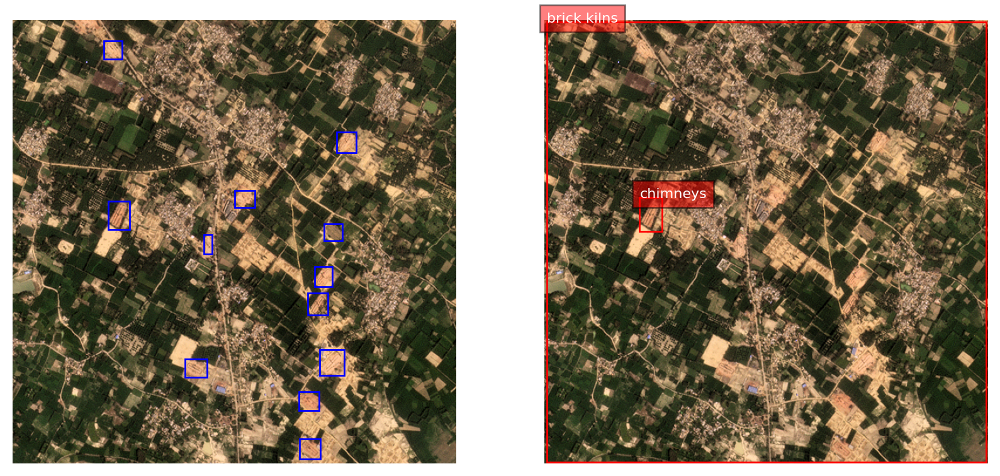

{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.760009765625]], 'labels': ['brick kilns']}
{'bboxes': [[2.240000009536743, 2.240000009536743, 637.760009765625, 638.3999633789062], [2.240000009536743, 1.5999999046325684, 637.760009765625, 638.3999633789062]], 'labels': ['brick kilns', 'chimneys']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.1199951171875], [353.6000061035156, 292.79998779296875, 386.8800048828125, 334.3999938964844]], 'labels': ['brick kilns', 'chimneys']}


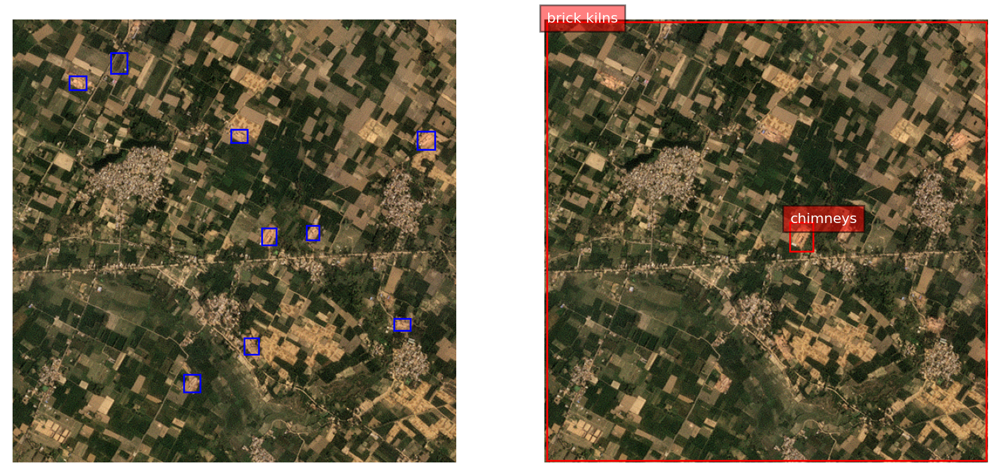

{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.1199951171875]], 'labels': ['brick kilns']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.1199951171875]], 'labels': ['brick kilns']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.1199951171875]], 'labels': ['brick kilns']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.1199951171875]], 'labels': ['brick kilns']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.1199951171875]], 'labels': ['brick kilns']}
{'bboxes': [[2.879999876022339, 3.5199999809265137, 637.1199951171875, 637.760009765625]], 'labels': ['brick kilns']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 636.47998046875]], 'labels': ['brick kilns']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.760009765625]], 'labels': ['brick kilns']}
{'bboxes': [[2.879999876022339, 3.5199999809265137, 637.119

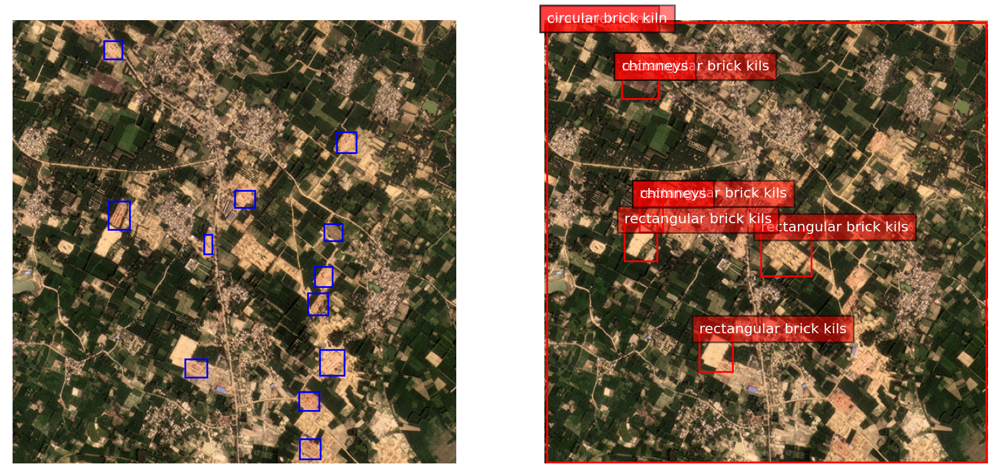

{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.760009765625], [2.879999876022339, 2.879999876022339, 637.760009765625, 638.3999633789062], [155.1999969482422, 383.03997802734375, 294.0799865722656, 495.03997802734375], [91.83999633789062, 460.47998046875, 187.83999633789062, 544.3200073242188], [443.8399963378906, 380.47998046875, 527.0399780273438, 464.9599914550781], [104.63999938964844, 461.1199951171875, 164.16000366210938, 518.719970703125], [445.1199951171875, 301.1199951171875, 484.1600036621094, 340.79998779296875], [243.51998901367188, 2.240000009536743, 296.6399841308594, 52.79999923706055]], 'labels': ['oval brick kilns', 'circular brick kiln', 'rectangular brick kils', 'rectangular brick kils', 'rectangular brick kils', 'rectangular brick kils', 'rectangular brick kils', 'chimneys']}
{'bboxes': [[2.240000009536743, 2.240000009536743, 637.1199951171875, 637.760009765625], [2.240000009536743, 2.240000009536743, 637.760009765625, 638.3999633789062], 

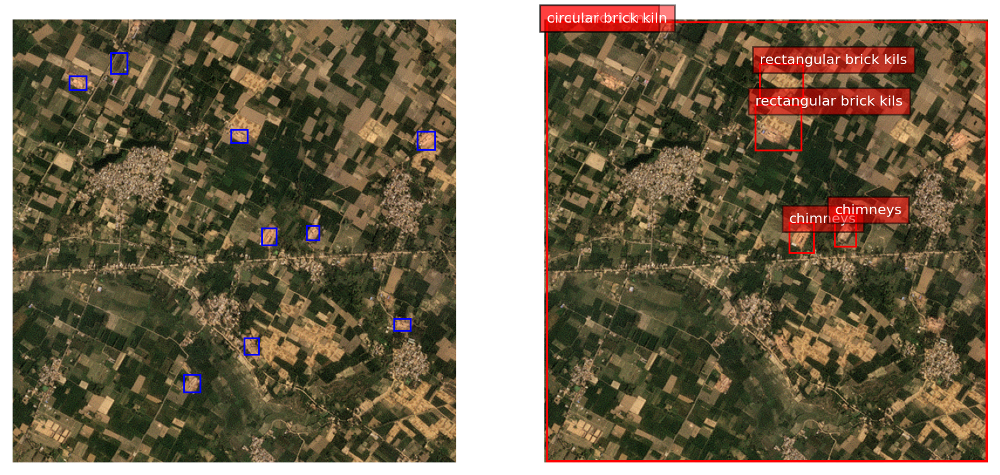

{'bboxes': [[2.879999876022339, 3.5199999809265137, 637.760009765625, 637.760009765625], [196.8000030517578, 329.2799987792969, 295.3599853515625, 395.1999816894531], [82.23999786376953, 299.8399963378906, 136.0, 347.1999816894531], [173.75999450683594, 465.5999755859375, 214.0800018310547, 509.1199951171875], [198.72000122070312, 520.0, 240.95999145507812, 559.6799926757812], [138.55999755859375, 344.0, 173.75999450683594, 384.9599914550781], [82.23999786376953, 299.8399963378906, 135.36000061035156, 347.1999816894531], [173.75999450683594, 465.5999755859375, 213.44000244140625, 509.1199951171875], [198.72000122070312, 520.6400146484375, 240.95999145507812, 559.6799926757812], [82.87999725341797, 299.8399963378906, 136.0, 346.55999755859375], [138.55999755859375, 344.0, 173.1199951171875, 384.9599914550781], [82.87999725341797, 299.8399963378906, 135.36000061035156, 346.55999755859375]], 'labels': ['oval brick kilns', 'circular brick kiln', 'circular bricks kilns', 'circular bricks ki

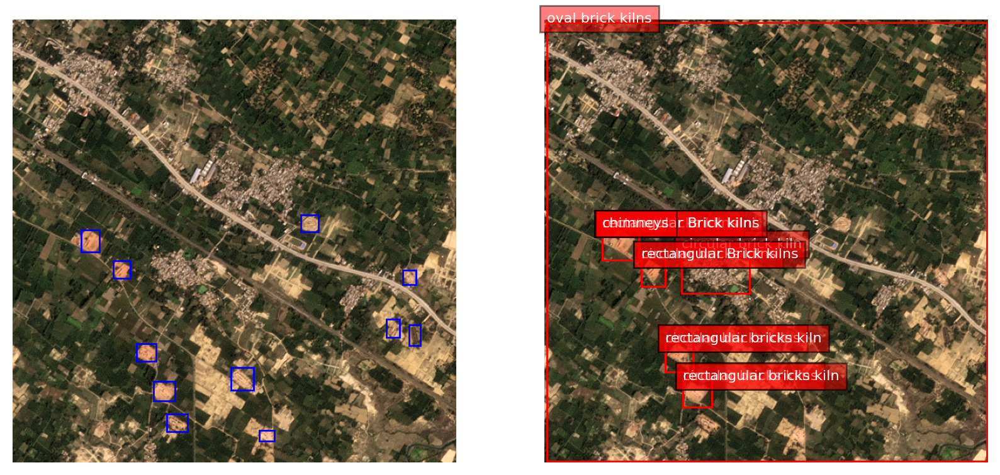

{'bboxes': [[2.879999876022339, 2.879999876022339, 637.760009765625, 637.760009765625], [2.240000009536743, 2.879999876022339, 637.760009765625, 638.3999633789062], [2.240000009536743, 2.879999876022339, 638.3999633789062, 638.3999633789062]], 'labels': ['oval brick kilns', 'circular brick kiln', 'rectangular brick kils']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.760009765625, 637.760009765625], [2.240000009536743, 2.879999876022339, 637.760009765625, 638.3999633789062], [2.240000009536743, 2.879999876022339, 638.3999633789062, 638.3999633789062]], 'labels': ['oval brick kilns', 'circular brick kiln', 'rectangular brick kil']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.760009765625], [2.240000009536743, 2.879999876022339, 637.1199951171875, 638.3999633789062], [2.240000009536743, 2.879999876022339, 637.760009765625, 638.3999633789062], [516.7999877929688, 38.07999801635742, 545.5999755859375, 125.75999450683594]], 'labels': ['oval brick kiln

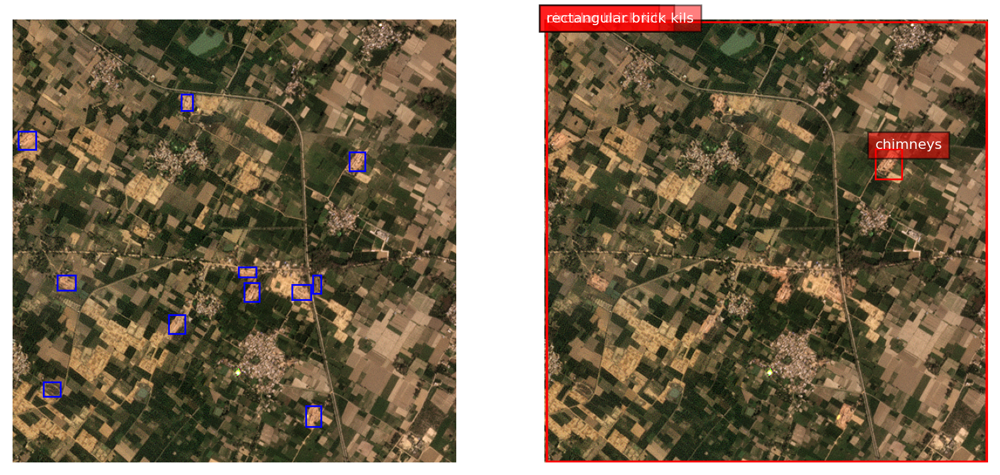

{'bboxes': [[2.879999876022339, 4.159999847412109, 637.1199951171875, 637.760009765625], [2.240000009536743, 4.159999847412109, 637.1199951171875, 638.3999633789062], [185.9199981689453, 111.68000030517578, 452.1600036621094, 287.67999267578125], [147.52000427246094, 0.9599999785423279, 203.1999969482422, 41.279998779296875]], 'labels': ['oval brick kilns', 'circular brick kiln', 'rectangular brick kils', 'chimneys']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.1199951171875], [2.240000009536743, 2.879999876022339, 637.1199951171875, 637.760009765625], [336.9599914550781, 199.36000061035156, 408.0, 295.3599853515625], [209.59999084472656, 128.3199920654297, 267.1999816894531, 193.59999084472656], [79.68000030517578, 369.6000061035156, 135.36000061035156, 439.3599853515625]], 'labels': ['oval brick kilns', 'circular brick kiln', 'rectangular brick kils', 'rectangular brick kils', 'chimneys']}
{'bboxes': [[2.240000009536743, 2.879999876022339, 637.1199951171

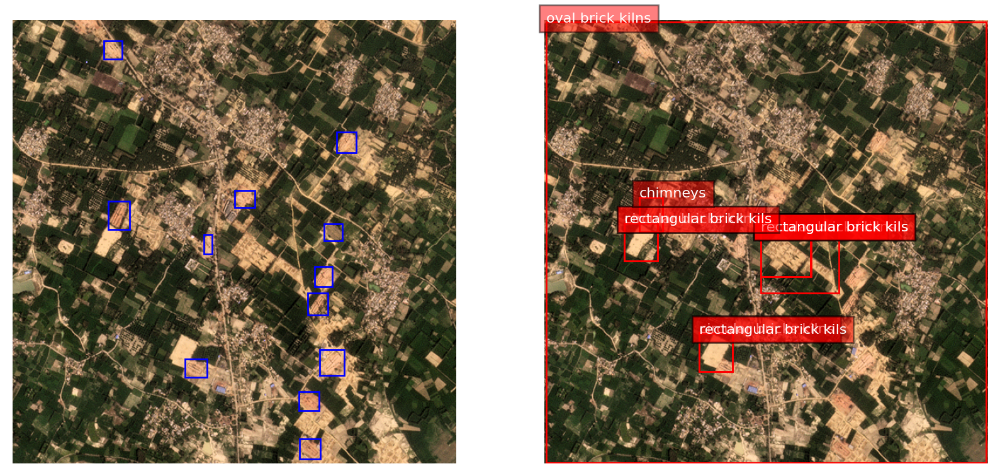

{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.760009765625], [2.240000009536743, 2.879999876022339, 637.1199951171875, 638.3999633789062], [443.8399963378906, 380.47998046875, 527.0399780273438, 464.9599914550781], [443.8399963378906, 380.47998046875, 527.6799926757812, 464.9599914550781], [443.8399963378906, 380.47998046875, 528.3200073242188, 464.9599914550781], [105.27999877929688, 461.1199951171875, 164.16000366210938, 518.719970703125], [445.1199951171875, 301.1199951171875, 484.1600036621094, 340.79998779296875], [243.51998901367188, 2.240000009536743, 296.6399841308594, 52.79999923706055]], 'labels': ['satellite image', 'oval brick kilns', 'circular brick kiln', 'circular bricks kilns', 'rectangular brick kils', 'rectangular brick kils', 'rectangular brick kils', 'chimneys']}
{'bboxes': [[2.240000009536743, 2.240000009536743, 637.1199951171875, 637.760009765625], [2.240000009536743, 2.240000009536743, 637.760009765625, 638.3999633789062], [2.240000009

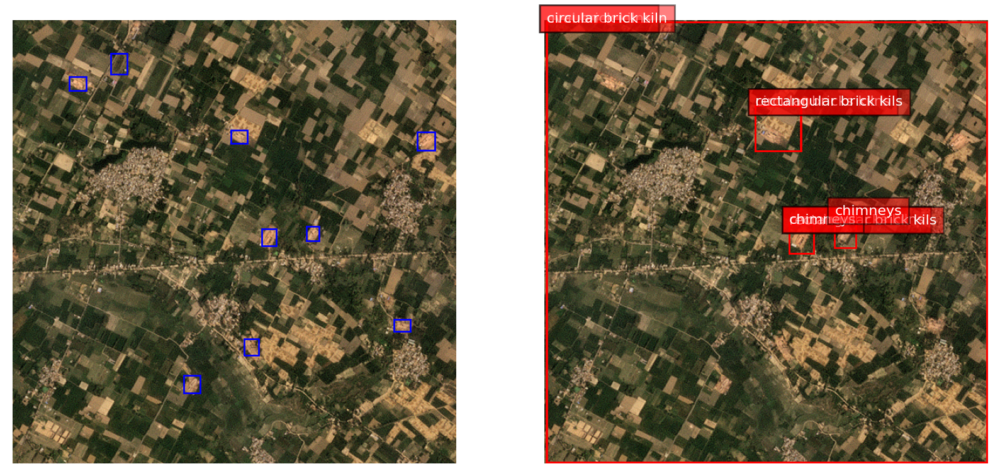

{'bboxes': [[2.240000009536743, 3.5199999809265137, 637.760009765625, 637.760009765625], [2.240000009536743, 2.879999876022339, 637.760009765625, 638.3999633789062], [80.95999908447266, 299.1999816894531, 136.0, 347.8399963378906], [80.95999908447266, 299.1999816894531, 136.63999938964844, 347.8399963378906], [173.1199951171875, 464.9599914550781, 214.0800018310547, 509.1199951171875], [198.0800018310547, 520.0, 240.95999145507812, 559.6799926757812], [137.9199981689453, 343.3599853515625, 173.75999450683594, 384.9599914550781], [80.95999908447266, 299.1999816894531, 137.27999877929688, 347.8399963378906], [173.1199951171875, 464.9599914550781, 214.72000122070312, 509.1199951171875], [81.5999984741211, 299.1999816894531, 136.0, 347.1999816894531], [198.0800018310547, 520.0, 240.3199920654297, 559.6799926757812], [137.9199981689453, 344.0, 173.75999450683594, 384.9599914550781], [81.5999984741211, 299.1999816894531, 135.36000061035156, 347.1999816894531], [173.1199951171875, 464.9599914

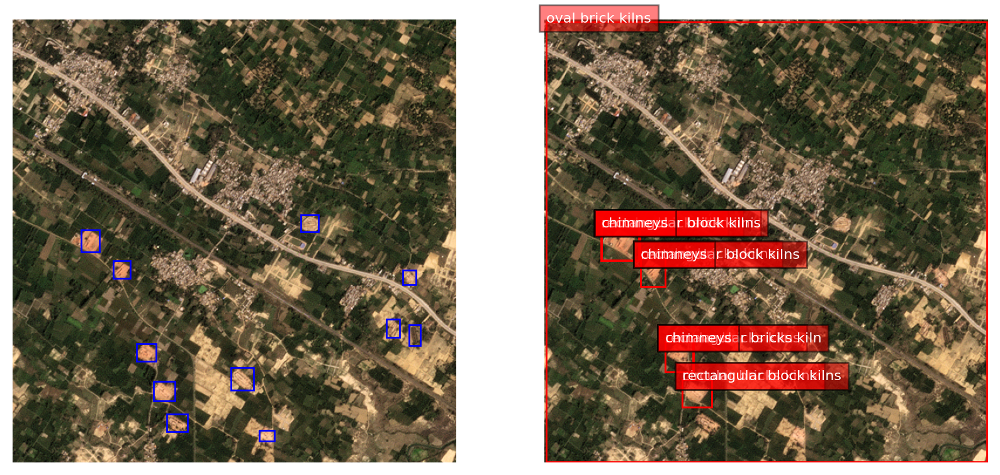

{'bboxes': [[2.240000009536743, 2.879999876022339, 637.760009765625, 637.760009765625], [2.240000009536743, 2.240000009536743, 637.760009765625, 638.3999633789062], [2.240000009536743, 2.240000009536743, 638.3999633789062, 638.3999633789062], [95.04000091552734, 343.3599853515625, 144.95999145507812, 393.91998291015625]], 'labels': ['satellite image', 'oval brick kilns', 'circular brick kiln', 'rectangular brick kils']}
{'bboxes': [[2.240000009536743, 2.879999876022339, 637.760009765625, 637.760009765625], [2.240000009536743, 2.240000009536743, 637.760009765625, 638.3999633789062], [2.240000009536743, 2.240000009536743, 638.3999633789062, 638.3999633789062], [1.5999999046325684, 467.5199890136719, 83.5199966430664, 592.9599609375]], 'labels': ['satellite image', 'oval brick kilns', 'circular brick kiln', 'rectangular brick kils']}
{'bboxes': [[2.240000009536743, 2.879999876022339, 637.1199951171875, 637.760009765625], [2.240000009536743, 2.240000009536743, 637.1199951171875, 638.399963

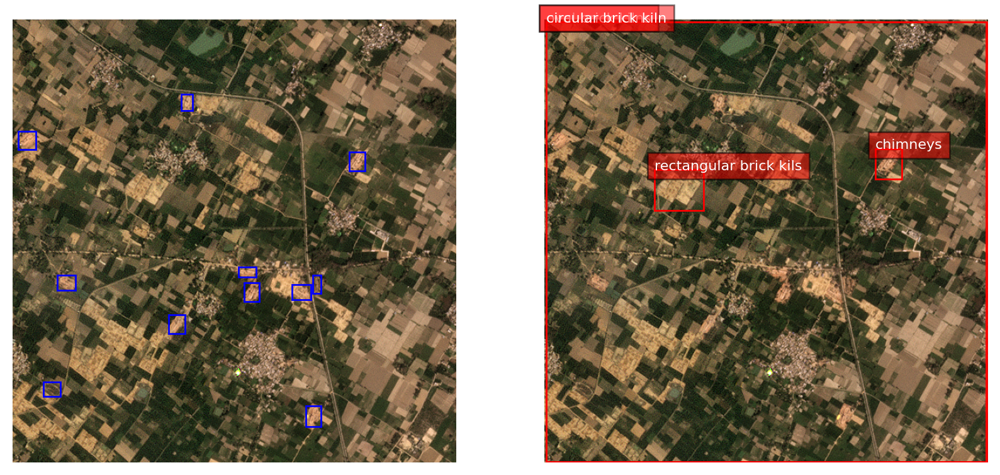

{'bboxes': [[2.879999876022339, 3.5199999809265137, 637.1199951171875, 637.760009765625], [2.240000009536743, 3.5199999809265137, 637.1199951171875, 638.3999633789062], [2.240000009536743, 4.159999847412109, 637.1199951171875, 638.3999633789062], [185.9199981689453, 111.68000030517578, 452.1600036621094, 287.67999267578125], [147.52000427246094, 0.9599999785423279, 203.1999969482422, 41.279998779296875]], 'labels': ['satellite image', 'oval brick kilns', 'circular brick kiln', 'rectangular brick kils', 'chimneys']}
{'bboxes': [[2.879999876022339, 2.879999876022339, 637.1199951171875, 637.1199951171875], [2.240000009536743, 2.240000009536743, 637.1199951171875, 637.760009765625], [78.4000015258789, 368.9599914550781, 136.63999938964844, 441.2799987792969], [307.5199890136719, 325.44000244140625, 390.7200012207031, 414.3999938964844], [209.59999084472656, 128.3199920654297, 267.1999816894531, 193.59999084472656], [307.5199890136719, 325.44000244140625, 390.0799865722656, 414.399993896484

In [21]:

pred_kilns = [0]*13
corr_preds = [0]*13
kilns_found_list = [0]*13
iou_th = 0.3
test_list = range(13)
for x in test_list:
    gt_kilns = 0
    print()
    print("Text prompt:", task_prompts[x] + text_prompts[x])
    print("IoU threshold:", iou_th)
    for i in range(15):
        im_path = img_paths[i]
        lab_path = lab_paths[i]
        gt_num, pred_num, num_corr, kilns_found = compare_gt_pred(im_path, lab_path, task_prompts[x], text_prompts[x], iou_th)
        pred_kilns[x]+=pred_num
        corr_preds[x]+=num_corr
        kilns_found_list[x]+=kilns_found
        gt_kilns += gt_num
       
    print('Actual number of kilns =', gt_kilns)
    print("Predicted number of kilns =", pred_kilns[x])
    print("Number of predictions that matched with ground truth kilns =", corr_preds[x])
    print("Number of kilns identified correctly =", kilns_found_list[x])
    print()
    if corr_preds[x]!=0:
        prec = corr_preds[x]/pred_kilns[x]
        print("Precision =", prec)
        rec = kilns_found_list[x]/gt_kilns
        print("Recall =", rec)
        f1 = 2*prec*rec/(prec+rec)
        print("F1 score =", f1)